In [3]:
cd /allen/programs/braintv/workgroups/neuralcoding/Parastoo/Mask_RCNN/

/allen/programs/braintv/workgroups/neuralcoding/Parastoo/Mask_RCNN


In [4]:
import os
import sys
import itertools
import math
import logging
import json
import re
import random
import time
import concurrent.futures
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.lines as lines
from matplotlib.patches import Polygon
import imgaug
from imgaug import augmenters as iaa
import skimage
# Root directory of the project
ROOT_DIR = os.getcwd()
if ROOT_DIR.endswith("samples/nucleus"):
    # Go up two levels to the repo root
    ROOT_DIR = os.path.dirname(os.path.dirname(ROOT_DIR))
    
# Import Mask RCNN
sys.path.append(ROOT_DIR)
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
from mrcnn import model as modellib
from mrcnn.model import log

import vesicle

%matplotlib inline 

Using TensorFlow backend.


In [5]:
# Dataset directory
DATASET_DIR = '/allen/programs/braintv/workgroups/neuralcoding/Parastoo'

class NoResizeConfig(vesicle.NucleusConfig):
    IMAGE_RESIZE_MODE = "none"
    
config = NoResizeConfig()

In [6]:
# Load dataset
dataset = vesicle.NucleusDataset()
# The subset is the name of the sub-directory, such as stage1_train,
# stage1_test, ...etc. You can also use these special values:
#     train: loads stage1_train but excludes validation images
#     val: loads validation images from stage1_train. For a list
#          of validation images see nucleus.py
dataset.load_nucleus(DATASET_DIR, subset="threeD_valid")

# Must call before using the dataset
dataset.prepare()

print("Image Count: {}".format(len(dataset.image_ids)))
print("Class Count: {}".format(dataset.num_classes))
for i, info in enumerate(dataset.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Image Count: 12
Class Count: 3
  0. BG                                                
  1. vesicles                                          
  2. mitochondria                                      


In [7]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

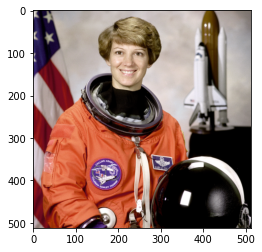

TypeError: 'ChangeColorspace' object is not callable

In [12]:
from skimage import data
image = data.astronaut()
plt.imshow(image)
plt.show()
# image = image[:,:,::-1]
# plt.imshow(image)
image_bgr = iaa.color.ChangeColorspace('BGR')
plt.imshow(image_bgr(image))

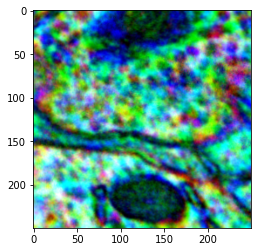

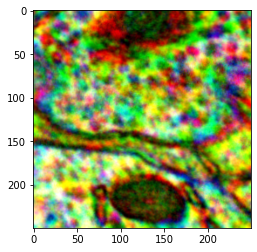

In [79]:
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
            dataset, config, image_id=1, use_mini_mask=False)
plt.imshow(image)
plt.show()
plt.imshow(image[:,:,::-1])

even 0
odd 1
even 2
odd 3


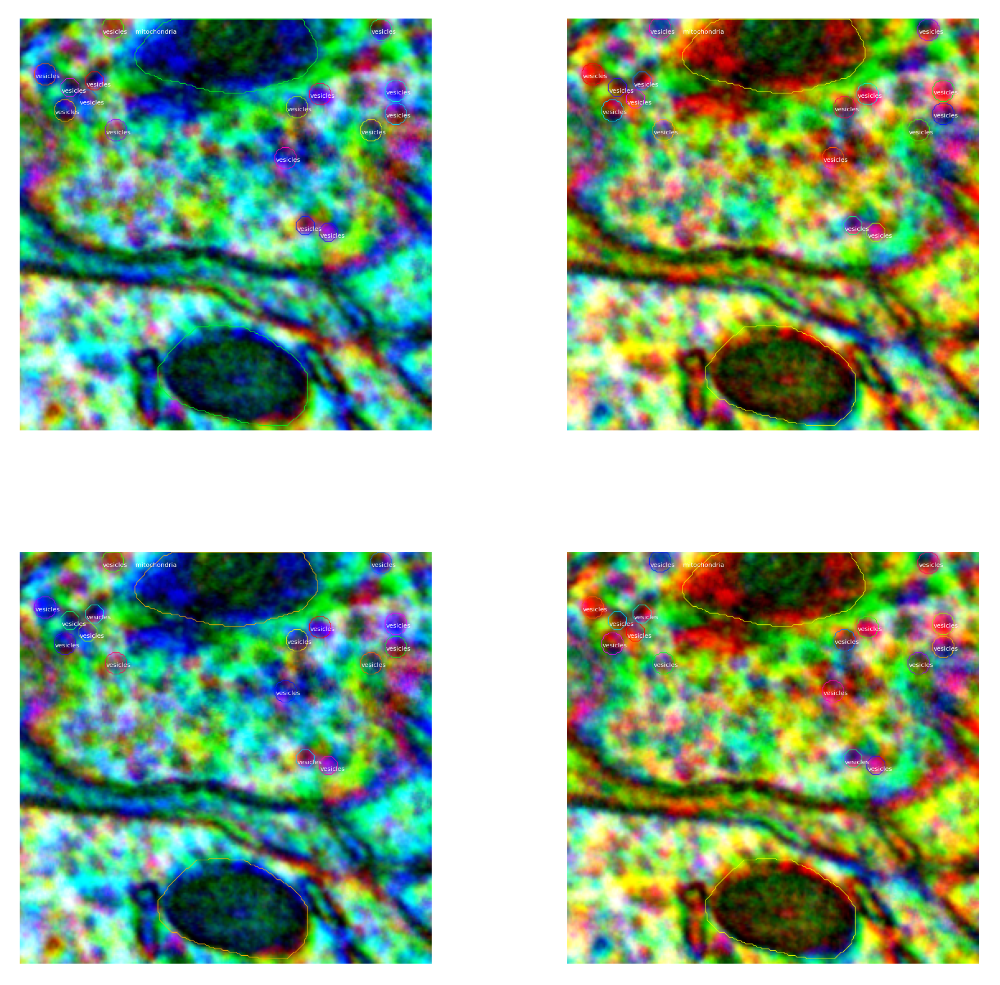

In [13]:
# List of augmentations
# http://imgaug.readthedocs.io/en/latest/source/augmenters.html

def test_aug(augmentation):
    image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
        dataset, config, image_id=1, use_mini_mask=False, augment=False, augmentation=augmentation)
#     image = data.astronaut()
#     image=image[:, :, 1]
#     image = skimage.color.gray2rgb(image)

    visualize.display_instances(image, bbox, mask, class_ids,
                                dataset.class_names,
                                show_mask=False, show_bbox=False, ax=ax[i//2, i % 2])
    
    
    
limit=4   
ax = get_ax(rows=2, cols=limit//2)
for i in np.arange(0,4):
    if i in (1, 3):
        print('odd', i)
        augmentation=iaa.Sometimes(0.9,
       iaa.color.ChangeColorspace('BGR'))
    else:
        print('even', i)
        augmentation=iaa.Sometimes(0.9,
       iaa.color.ChangeColorspace('RGB'))
    test_aug(augmentation)
    



In [15]:
from skimage import data
import imgaug as ia
image = data.astronaut()
images = [image, image, image, image]
seq = iaa.Sequential([
    iaa.Affine(rotate=(-25, 25)),
    iaa.AdditiveGaussianNoise(scale=(10, 60)),
    iaa.Crop(percent=(0, 0.2))
])

images_aug = seq(images=images)

print("Augmented:")
ia.imshow(np.hstack(images_aug))

TypeError: 'Sequential' object is not callable

8
ax[0, 0]
16
ax[0, 1]
24
ax[0, 2]
32
ax[0, 3]
40
ax[1, 0]
48
ax[1, 1]
56
ax[1, 2]
64
ax[1, 3]


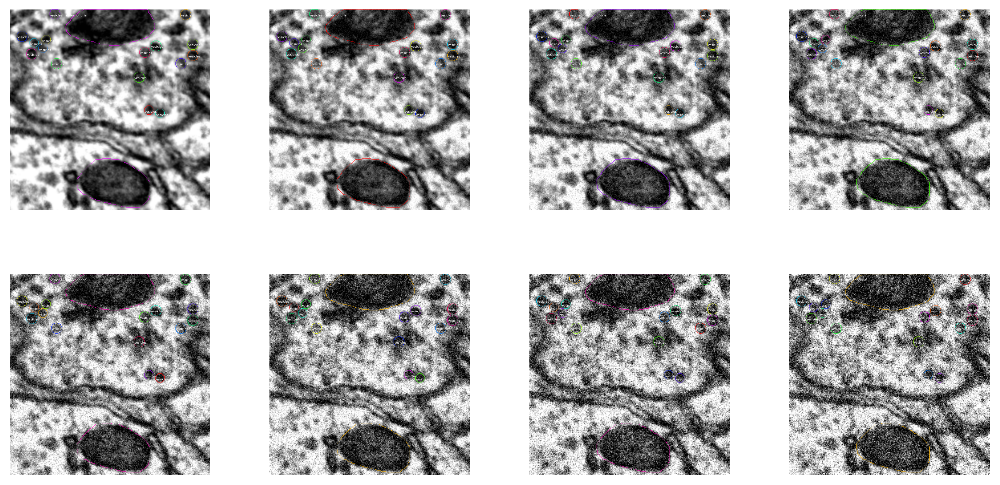

In [46]:
#    [iaa.Multiply((0.2 * i, 0.3* i))])

# Load the image multiple times to show augmentations
# [iaa.Multiply(0.3 + 0.3*i)]
limit = 2
ax = get_ax(rows=1, cols=limit//2)
for i in np.arange(limit):
    a = 8+ 8*i 
    print(a)
    augmentation = iaa.Sometimes(0.9,
       iaa.AdditiveGaussianNoise(scale=a)) 
    image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
        dataset, config, image_id=1, use_mini_mask=False, augment=False, augmentation=augmentation)
    image=image[:, :, 1]
    print('ax[{}, {}]'.format(i//4, i % 4))
    image = skimage.color.gray2rgb(image)
    visualize.display_instances(image, bbox, mask, class_ids,
                                dataset.class_names, ax=ax[i//2, i % 2],
                                show_mask=False, show_bbox=False)
    

    
# plt.savefig('/allen/programs/braintv/workgroups/neuralcoding/Parastoo/ves_img/augmentation.png')

In [35]:
def generate_aug_plt(augmentation, limit, item):
    ax = get_ax(rows=4, cols=limit//4)
    i=1
    image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
        dataset, config, image_id=i, use_mini_mask=False, augment=False, augmentation=augmentation)
    image=image[:, :, 1]
    image = skimage.color.gray2rgb(image)
    visualize.display_instances(image, bbox, mask, class_ids,
                                dataset.class_names, ax=ax[item//2, item % 2],
                                show_mask=False, show_bbox=False)

Bluring by 0 pixel
Bluring by 1 pixel
Bluring by 2 pixel
Bluring by 3 pixel
Bluring by 4 pixel
Bluring by 5 pixel
Bluring by 6 pixel
Bluring by 7 pixel


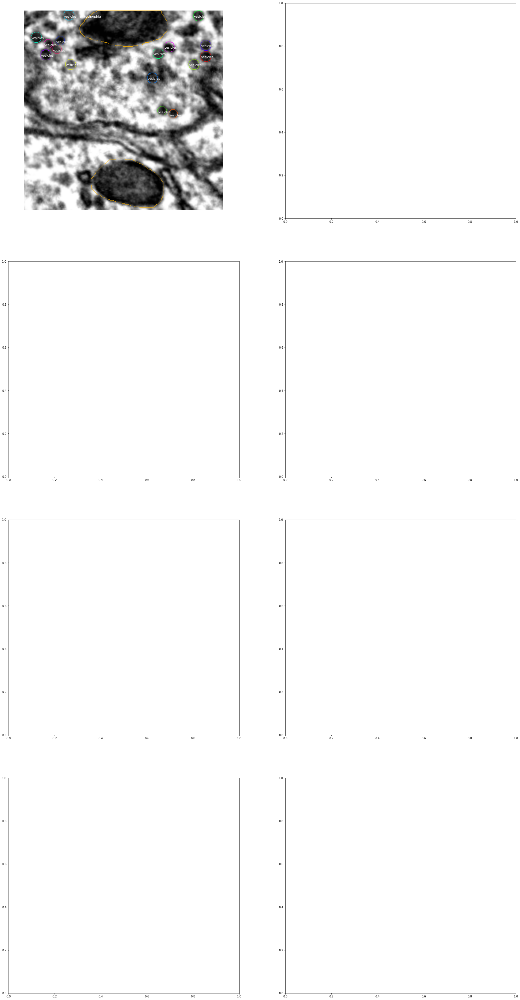

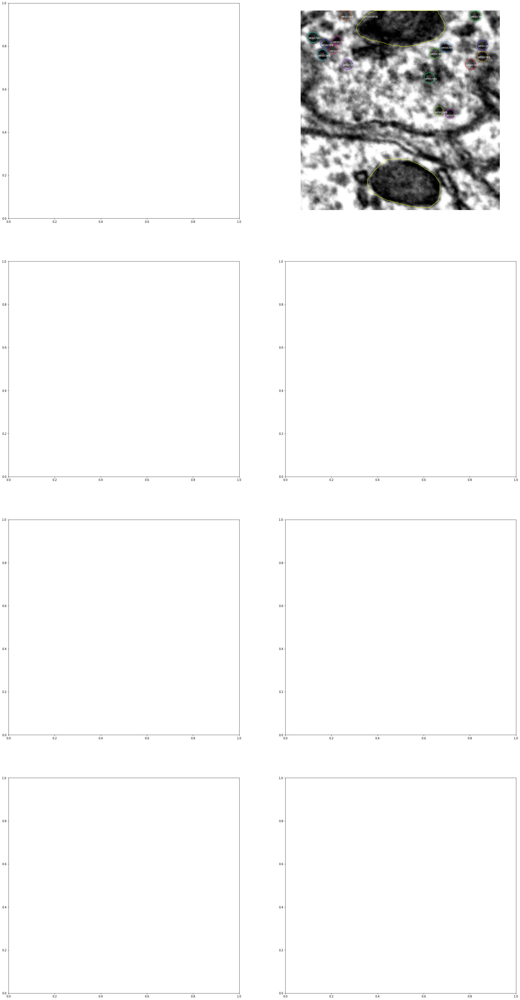

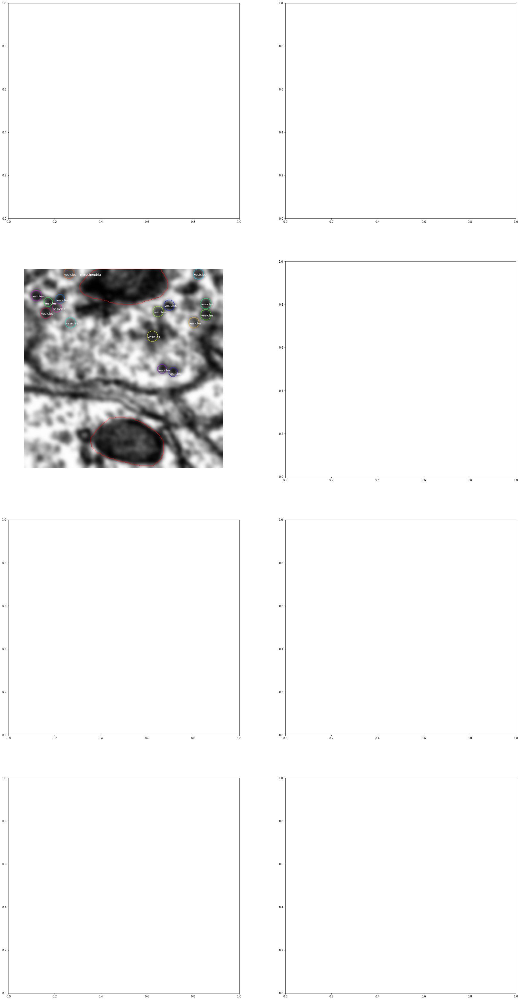

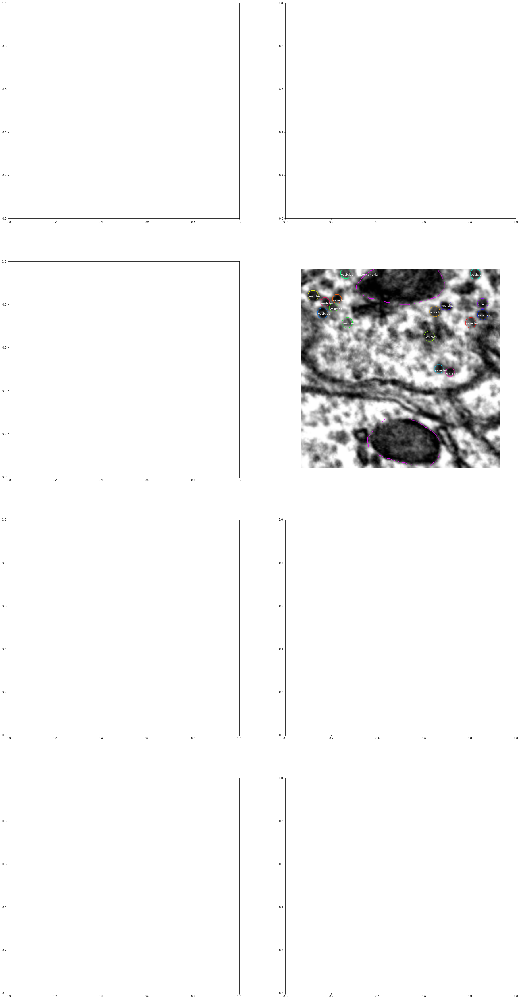

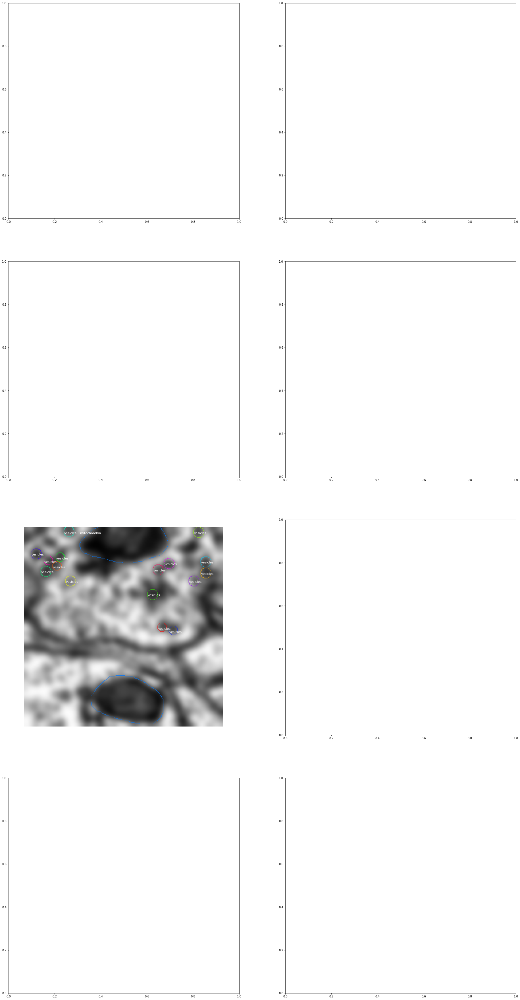

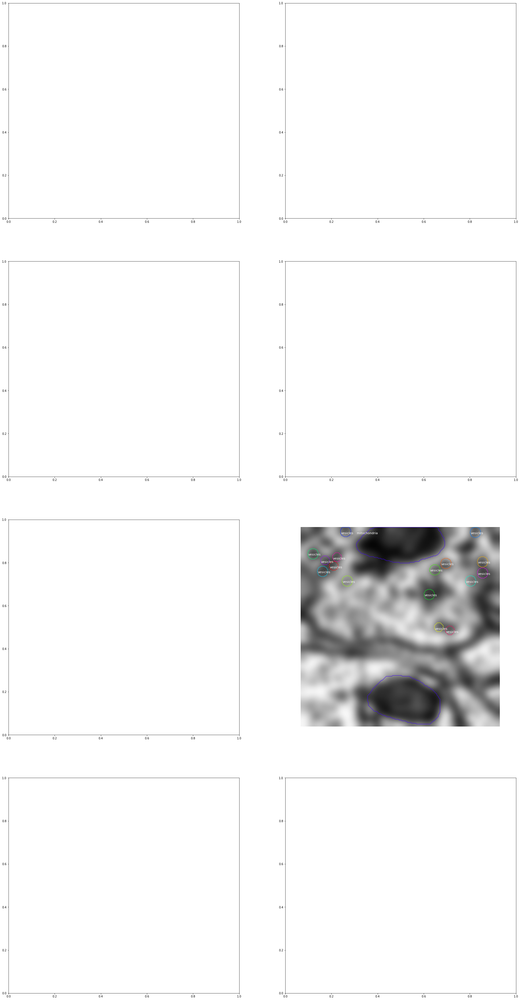

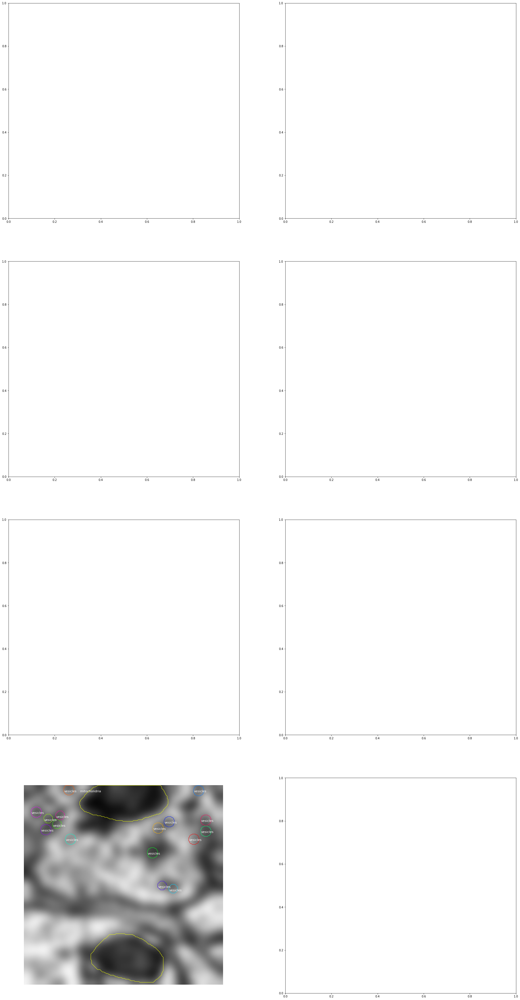

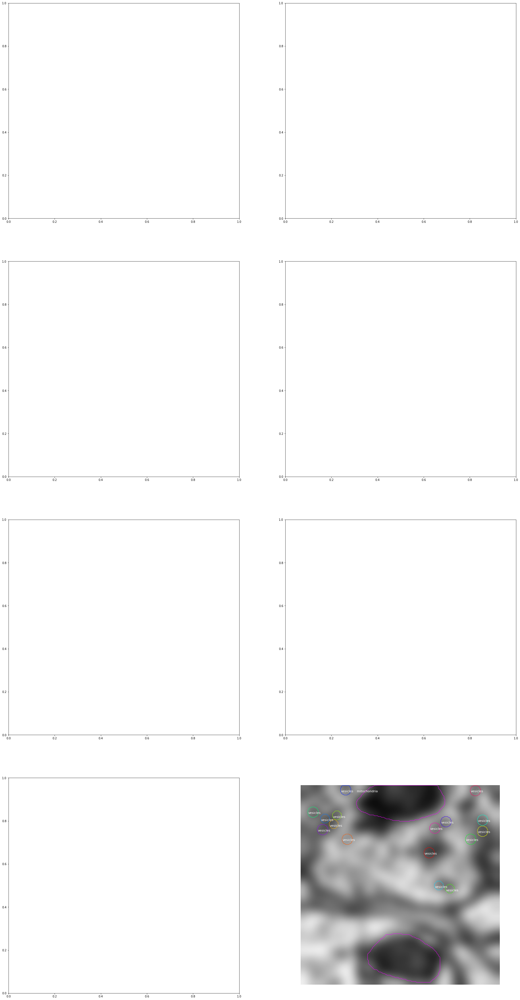

In [36]:
limit=8
for i in range(limit):
    print('Bluring by {} pixel'.format(i))
    augmentation = iaa.Sometimes(0.9,
   [ iaa.GaussianBlur(sigma=i)])
    generate_aug_plt(augmentation, limit, i)
    